In [ ]:
!pip install plotly

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

In [ ]:
path = '/content/drive/MyDrive/Analítica'

In [ ]:
# Librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from imblearn.under_sampling import NearMiss
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
from imblearn.ensemble import BalancedBaggingClassifier
from collections import Counter
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, cohen_kappa_score, f1_score, precision_recall_fscore_support
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score
from tqdm import tqdm

# Proyecto Final

 **Integrantes**:
- Román Pardo Alejandro
- Riubi Zuñiga Andrey
- Salazar Vega Rodrigo
- Verduzco Lozano Iván Antonio

El objetivo principal de este proyecto es 'Predecir los proveedores potencialmente fraudulentos' en función de las reclamaciones presentadas por ellos. También descubriremos cuáles son las variables más importantes que ayudan a detectar el comportamiento de proveedores potencialmente fraudulentos para que podamos señalar dichos reclamos y realizar una investigación profunda sobre ellos.

Los significados de algunas variables son:

#### 1. Inpatient and outpatient data:
- **ClaimID:** esta es una identificación única para cada reclamo enviado.
- **Bene_ID:** contiene la identificación única de los beneficiarios registrados para el plan de seguro.
- **AttendingPhysician:** columna que contiene el id de los médicos que atendieron al paciente.
- **OperatingPhysician:** la columna contiene la identificación de los médicos que operaron al paciente.
- **ClmDiagnosisCode:** contiene códigos de diagnóstico que los proveedores realizan en los pacientes.
- **ClmProcedureCode:** contiene códigos de procedimientos a los que se someten los pacientes.
- **Proveedor:** identificación única de los proveedores de atención médica.
- **InscClaimAmtReimbursed:** monto total pagado al reclamante después de la liquidación.
- **ClaimStartDt / ClaimEndDt:** estas columnas tienen la fecha en que se presentaron los reclamos y la fecha en que se liquidaron los reclamos, respectivamente.
- **AdmissionDt / HighDt:** Fecha en que el paciente ingresó en el hospital y la fecha en que el paciente fue dado de alta. Aplicable solo para datos de pacientes hospitalizados.

#### 2. Beneficiaries data:
- **Bene_ID:** contiene la identificación única de los beneficiarios registrados para el plan de seguro.
- **DOB:** Fecha de nacimiento de los beneficiarios registrados en el régimen de seguro.
- **Gender:** Género de los beneficiarios registrados en el régimen de seguro.
- **State/Country:** contiene el código de estado/país para los miembros registrados.
- **Premedical conditions:** hay algunas columnas como RenalDiseaseIndicator, ChronicCond_Depression, ChronicCond_Diabetes, etc. para indicar si el miembro tiene alguna condición médica previa.

#### 3. Target data:
- **Provider:** esta es una identificación única para cada uno de los proveedores de atención médica.
- **Target:** esta columna tiene dos valores, Sí y No, que indican si el proveedor correspondiente está marcado como fraude potencial o no.

In [ ]:
# Load Train Dataset

Train=pd.read_csv(path + "/data proyecto/Train-1542865627584.csv")
Train_Beneficiarydata=pd.read_csv(path + "/data proyecto/Train_Beneficiarydata-1542865627584.csv")
Train_Inpatientdata=pd.read_csv(path + "/data proyecto/Train_Inpatientdata-1542865627584.csv")
Train_Outpatientdata=pd.read_csv(path + "/data proyecto/Train_Outpatientdata-1542865627584.csv")

In [ ]:
Train_Inpatientdata.head(5)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,...,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,...,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,...,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,...,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,...,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
Train_Outpatientdata.head(5)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,...,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DeductibleAmtPaid,ClmAdmitDiagnosisCode
0,BENE11002,CLM624349,2009-10-11,2009-10-11,PRV56011,30,PHY326117,NaN,NaN,78943,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,56409
1,BENE11003,CLM189947,2009-02-12,2009-02-12,PRV57610,80,PHY362868,NaN,NaN,6115,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,79380
2,BENE11003,CLM438021,2009-06-27,2009-06-27,PRV57595,10,PHY328821,NaN,NaN,2723,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
3,BENE11004,CLM121801,2009-01-06,2009-01-06,PRV56011,40,PHY334319,NaN,NaN,71988,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
4,BENE11004,CLM150998,2009-01-22,2009-01-22,PRV56011,200,PHY403831,NaN,NaN,82382,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,71947


In [ ]:
Train_Beneficiarydata.head(5)

,BeneID,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,...,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt
0,BENE11001,1943-01-01,NaN,1,1,0,39,230,12,12,...,1,1,1,2,1,1,36000,3204,60,70
1,BENE11002,1936-09-01,NaN,2,1,0,39,280,12,12,...,2,2,2,2,2,2,0,0,30,50
2,BENE11003,1936-08-01,NaN,1,1,0,52,590,12,12,...,2,2,1,2,2,2,0,0,90,40
3,BENE11004,1922-07-01,NaN,1,1,0,39,270,12,12,...,2,1,1,1,1,2,0,0,1810,760
4,BENE11005,1935-09-01,NaN,1,1,0,24,680,12,12,...,2,1,2,2,2,2,0,0,1790,1200


In [ ]:
Train.head(5)

,Provider,PotentialFraud
0,PRV51001,No
1,PRV51003,Yes
2,PRV51004,No
3,PRV51005,Yes
4,PRV51007,No


In [ ]:
unique_ben_inpat = Train_Inpatientdata['BeneID'].unique()
unique_ben_outpat = Train_Outpatientdata['BeneID'].unique()
valores_comunes = set(unique_ben_inpat) & set(unique_ben_outpat)
print("Cantidad de valores comunes: ", len(valores_comunes))

unique_provider = Train['Provider'].unique()
print("Cantidad de valores unicos de proveedores: ", len(unique_provider))

# Unimos los datos de los pacientes inpatient y outpatient
Train_Inpatientdata['is_inpatient'] = 1
Train_Outpatientdata['is_inpatient'] = 0
Train_InOutdata = pd.concat([Train_Inpatientdata, Train_Outpatientdata], axis=0, ignore_index=True)
Train_InOutdata.head(5)

Cantidad de valores comunes:  26713
Cantidad de valores unicos de proveedores:  5410


,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,...,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,is_inpatient
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,...,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,...,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,...,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,...,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
# Unimos los datos de los pacientes del beneficieario con los datos de los pacientes inpatient y outpatient
Train_InOutdata = pd.merge(Train_InOutdata, Train_Beneficiarydata, on='BeneID')
Train_InOutdata.head(5)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,...,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,...,1,1,1,2,1,1,36000,3204,60,70
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,...,1,1,1,2,1,1,36000,3204,60,70
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,...,1,1,1,2,1,1,36000,3204,60,70
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,...,1,1,2,2,1,1,5000,1068,250,320
4,BENE11011,CLM144521,2009-01-18,2009-01-18,PRV52314,50,PHY379398,NaN,NaN,NaN,...,1,1,2,2,1,1,5000,1068,250,320


In [ ]:
# match Provider column in Train_InOutdata using Provider column in Train
Train_InOutdata = pd.merge(Train_InOutdata, Train[['Provider', 'PotentialFraud']], on='Provider', how='left')
Train_InOutdata.head(5)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,...,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,PotentialFraud
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,...,1,1,2,1,1,36000,3204,60,70,Yes
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,...,1,1,2,1,1,36000,3204,60,70,No
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,...,1,1,2,1,1,36000,3204,60,70,No
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,...,1,2,2,1,1,5000,1068,250,320,No
4,BENE11011,CLM144521,2009-01-18,2009-01-18,PRV52314,50,PHY379398,NaN,NaN,NaN,...,1,2,2,1,1,5000,1068,250,320,No


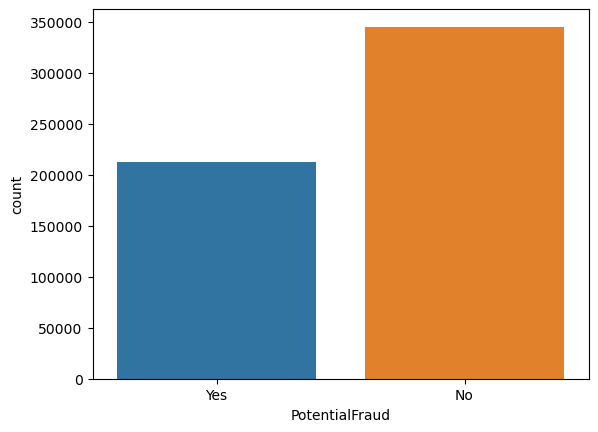

In [ ]:
# Distribucion de los datos de los potenciales fraudes
sns.countplot(x='PotentialFraud', data=Train_InOutdata)
plt.show()

In [ ]:
# Porcentaje de valores nulos por columna ordenados de mayor a menor
Train_InOutdata.isnull().sum().sort_values(ascending=False)[0:10]/len(Train_InOutdata)

ClmProcedureCode_6     1.000000
ClmProcedureCode_5     0.999984
ClmProcedureCode_4     0.999789
ClmProcedureCode_3     0.998264
DOD                    0.992600
ClmDiagnosisCode_10    0.991025
ClmProcedureCode_2     0.990165
ClmProcedureCode_1     0.958242
DiagnosisGroupCode     0.927493
AdmissionDt            0.927493
dtype: float64

In [ ]:
# Remove ClmProcedureCodes by adding the count of ClmProcedureCodes
Train_InOutdata['Procedure_count'] = Train_InOutdata['ClmProcedureCode_1'].notnull().astype(int) + Train_InOutdata['ClmProcedureCode_2'].notnull().astype(int) + Train_InOutdata['ClmProcedureCode_3'].notnull().astype(int) + Train_InOutdata['ClmProcedureCode_4'].notnull().astype(int) + Train_InOutdata['ClmProcedureCode_5'].notnull().astype(int) + Train_InOutdata['ClmProcedureCode_6'].notnull().astype(int)
Train_InOutdata.drop(['ClmProcedureCode_1', 'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5', 'ClmProcedureCode_6'], axis=1, inplace=True)

# Remove ClmDiagnosisCodes by adding the count of ClmDiagnosisCodes
Train_InOutdata['Diagnosis_count'] = Train_InOutdata['ClmDiagnosisCode_1'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_2'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_3'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_4'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_5'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_6'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_7'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_8'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_9'].notnull().astype(int) + Train_InOutdata['ClmDiagnosisCode_10'].notnull().astype(int)
Train_InOutdata.drop(['ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10'], axis=1, inplace=True)


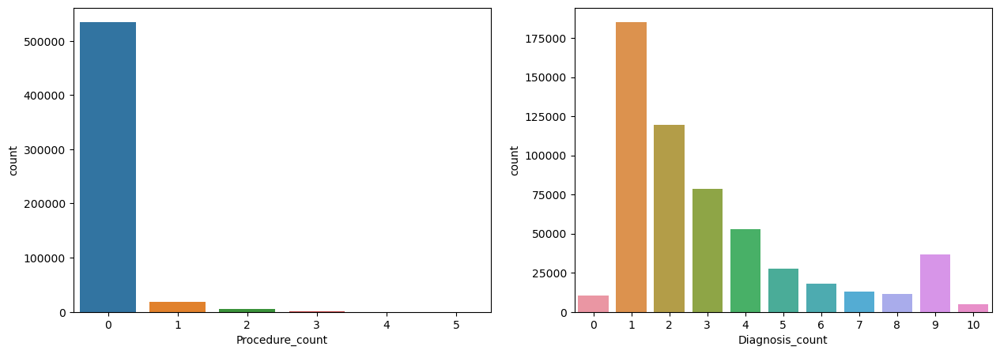

In [ ]:
# plot distribution of ClmprocedureCode_count and ClmDiagnosisCode_count
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.countplot(x='Procedure_count', data=Train_InOutdata, ax=ax[0])
sns.countplot(x='Diagnosis_count', data=Train_InOutdata, ax=ax[1])
plt.show()

In [ ]:
#Establecemos las calumnas con datos de tiempo en formato de fecha
Train_InOutdata['DOD'] = pd.to_datetime(Train_InOutdata['DOD'], format="%Y/%m/%d")
Train_InOutdata['DOB'] = pd.to_datetime(Train_InOutdata['DOB'], format="%Y/%m/%d")

Train_InOutdata['ClaimStartDt'] = pd.to_datetime(Train_InOutdata['ClaimStartDt'], format="%Y/%m/%d")
Train_InOutdata['ClaimEndDt'] = pd.to_datetime(Train_InOutdata['ClaimEndDt'], format="%Y/%m/%d")

Train_InOutdata['ClaimStartDt'] = pd.to_datetime(Train_InOutdata['ClaimStartDt'], format="%Y/%m/%d")
Train_InOutdata['ClaimEndDt'] = pd.to_datetime(Train_InOutdata['ClaimEndDt'], format="%Y/%m/%d")

In [ ]:
#Calculamos le edad de los beneficiarios, tomando en cuenta la fecha del fallecimiento más reciente
t_dod = Train_InOutdata['DOD'].unique()
t_dod = [x for x in t_dod if np.isnan(x) == False]
dod_max = max(t_dod)
Train_InOutdata['DOD'].fillna(dod_max, inplace=True)
Train_InOutdata['Age'] = np.round(((Train_InOutdata['DOD'] - Train_InOutdata['DOB']).dt.days)/365.0,0)

#Agregamos una columna para la duración de la reclamación
Train_InOutdata['CDT'] = (Train_InOutdata['ClaimEndDt'] - Train_InOutdata['ClaimStartDt']).dt.days
Train_InOutdata['CDT'] = (Train_InOutdata['ClaimEndDt'] - Train_InOutdata['ClaimStartDt']).dt.days

In [ ]:
#Sustitutendo nulos con la moda
Train_InOutdata['DeductibleAmtPaid'].fillna(0, inplace=True)

#Agregamos columna con la diferencia entre lo deducible y lo reembolsable
Train_InOutdata['DRD'] = Train_InOutdata['InscClaimAmtReimbursed'] - Train_InOutdata['DeductibleAmtPaid']
#Agregamos una columna que indique si el paciente sufrió un operación
Train_InOutdata['Operating'] = Train_InOutdata['OperatingPhysician'].apply(lambda val: 0 if val != val else 1)

#Modificar al codificación de la columna de enfermefdad renal
Train_InOutdata['RenalDiseaseIndicator'] = Train_InOutdata['RenalDiseaseIndicator'].apply(lambda val: 0 if val != "Y" else 1).values

# Potential Fraud de 0 a 1
Train_InOutdata['PotentialFraud'] = Train_InOutdata['PotentialFraud'].apply(lambda val: 0 if val != "Yes" else 1).values

In [ ]:
# remove ID columns and dates
Train_InOutdata.drop(['BeneID', 'ClaimID', 'ClaimEndDt', 'DiagnosisGroupCode', 'DOD',
                      'ClmAdmitDiagnosisCode', 'OperatingPhysician', 'AdmissionDt', 'DischargeDt',
                      'OtherPhysician', 'AttendingPhysician', 'ClaimStartDt', 'DOB'], axis=1, inplace=True)

In [ ]:
# Remove the providers with less than 10 claims
print('Number of providers before removing providers with less than 10 claims: ', len(Train_InOutdata['Provider'].unique()))
Train_InOutdata = Train_InOutdata.groupby('Provider').filter(lambda x: len(x) > 100)
print('Number of providers after removing providers with less than 10 claims: ', len(Train_InOutdata['Provider'].unique()))

# Convert to numeric the provider ID
Train_InOutdata['Provider'] = Train_InOutdata['Provider'].apply(lambda x: x.split('PRV')[1]).astype(int)

Number of providers before removing providers with less than 10 claims:  5410
Number of providers after removing providers with less than 10 claims:  1219


In [ ]:
# Porcentaje de valores nulos por columna ordenados de mayor a menor
Train_InOutdata.isnull().sum().sort_values(ascending=False)[0:10]/len(Train_InOutdata)

Provider                    0.0
ChronicCond_Diabetes        0.0
DRD                         0.0
CDT                         0.0
Age                         0.0
Diagnosis_count             0.0
Procedure_count             0.0
PotentialFraud              0.0
OPAnnualDeductibleAmt       0.0
OPAnnualReimbursementAmt    0.0
dtype: float64

In [ ]:
Train_InOutdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 441013 entries, 0 to 558210
Data columns (total 33 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Provider                         441013 non-null  int32  
 1   InscClaimAmtReimbursed           441013 non-null  int64  
 2   DeductibleAmtPaid                441013 non-null  float64
 3   is_inpatient                     441013 non-null  int64  
 4   Gender                           441013 non-null  int64  
 5   Race                             441013 non-null  int64  
 6   RenalDiseaseIndicator            441013 non-null  int64  
 7   State                            441013 non-null  int64  
 8   County                           441013 non-null  int64  
 9   NoOfMonths_PartACov              441013 non-null  int64  
 10  NoOfMonths_PartBCov              441013 non-null  int64  
 11  ChronicCond_Alzheimer            441013 non-null  int64  
 12  Ch

In [ ]:
# Obtenemos las columnas del dataset
col = Train_InOutdata.columns
print("Columnas: ", len(col))

# Columnas nominales
col_nom = [
    'is_inpatient', 'Gender', 'Race', 'State', 'County', 'RenalDiseaseIndicator',
    'NoOfMonths_PartBCov', 'NoOfMonths_PartACov', 'ChronicCond_Alzheimer',
    'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
    'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression', 'ChronicCond_Diabetes',
    'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
    'ChronicCond_stroke'
]

# Obtenemos las columnas numéricas
col_num = [x for x in col if x not in col_nom]

print("Columnas nominales: ", len(col_nom))
print("Columnas numéricas: ", len(col_num))


Columnas:  33
Columnas nominales:  19
Columnas numéricas:  14


In [ ]:
X = Train_InOutdata.drop(['PotentialFraud'], axis=1)
y = Train_InOutdata['PotentialFraud']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
                                                    X,
                                                    y,
                                                    test_size=0.3,
                                                    shuffle = True,
                                                    random_state = 137,
                                                    stratify = y
                                                    )
sc = MinMaxScaler()
X_train_s = sc.fit_transform(X_train)
X_test_s = sc.transform(X_test)
X_test_sub = pd.DataFrame(X_test_s, columns=X_test.columns)

In [ ]:
# Codigo del submuestreo
rus = RandomUnderSampler(random_state=137)
X_train_sub, y_train_sub = rus.fit_resample(X_train_s, y_train)

In [ ]:
y_train_sub.value_counts()

0    142943
1    142943
Name: PotentialFraud, dtype: int64

In [ ]:
X_train_sub = pd.DataFrame(X_train_sub, columns=X_train.columns)

<function matplotlib.pyplot.show(close=None, block=None)>

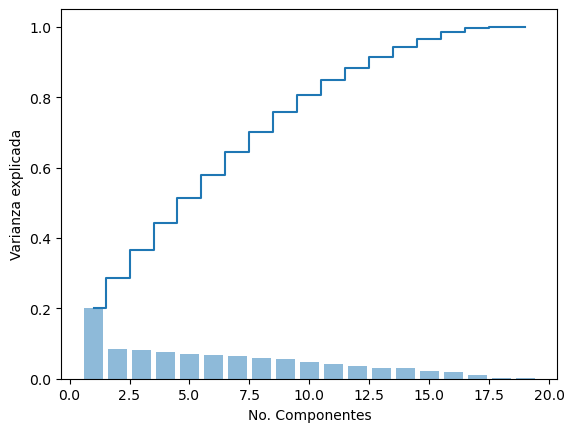

In [ ]:
mat_cov = np.cov(X_train_sub[col_nom].T)
eig_val, eig_vec = np.linalg.eig(mat_cov)
var_exp = [(i / sum(eig_val)) for i in sorted(eig_val, reverse = True)]
var_exp_cum = np.cumsum(var_exp)

plt.bar(range(1, len(eig_val) + 1), var_exp, alpha = 0.5, align = 'center')
plt.step(range(1, len(eig_val) + 1), var_exp_cum, where = 'mid')
plt.xlabel('No. Componentes')
plt.ylabel('Varianza explicada')
plt.show

In [ ]:
pca = PCA(n_components=8)
components = pca.fit_transform(X_train_sub[col_nom])
components_test = pca.transform(X_test_sub[col_nom])

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=y_train_sub,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [ ]:
# ELiminamos las columnas nominales
X_train_sub.drop(col_nom, axis=1, inplace=True)
X_test_sub.drop(col_nom, axis=1, inplace=True)

# Concatenamos las columnas numéricas con las columnas nominales transformadas
train_nom = pd.DataFrame(components, columns = [str(x) for x in range(0,8)])
test_nom = pd.DataFrame(components_test, columns = [str(x) for x in range(0,8)])
X_train = pd.concat([X_train_sub, train_nom], axis=1)
X_test = pd.concat([X_test_sub, test_nom], axis=1)

In [ ]:
def metricas(real, predict):
    # Calculo de sensitivity y specificity
    res = list()
    prec,recall,_,_ = precision_recall_fscore_support(real,
                                                      predict,
                                                      pos_label=True,average=None)

    fpr, tpr, thresholds = metrics.roc_curve(real, predict, pos_label=1)
    auc = metrics.auc(fpr, tpr)
    res.append([recall[0],recall[1],accuracy_score(real,predict),cohen_kappa_score(real, predict),auc, f1_score(real, predict)])
    resumen = pd.DataFrame(res,columns = ['sensitivity','specificity', 'Accuracy val', 'Kappa Value:', 'Auc', 'F1_score:'])

    print(resumen)
    # display confusion_matrix
    cm = confusion_matrix(real, predict, labels=np.unique(real))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=np.unique(real))
    disp.plot()

In [ ]:
# Cross validation
def cross_val(model, X_train, y_train, cv):
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy')
    return np.mean(scores)

In [ ]:
# Del X_train, sacamos conjunto de validación
X_train, X_val, y_train, y_val = train_test_split(X_train,
                                                    y_train_sub,
                                                    test_size=0.2,
                                                    shuffle = True,
                                                    random_state = 137,
                                                    stratify = y_train_sub
                                                    )

100%|██████████| 13/13 [00:53<00:00,  4.12s/it]


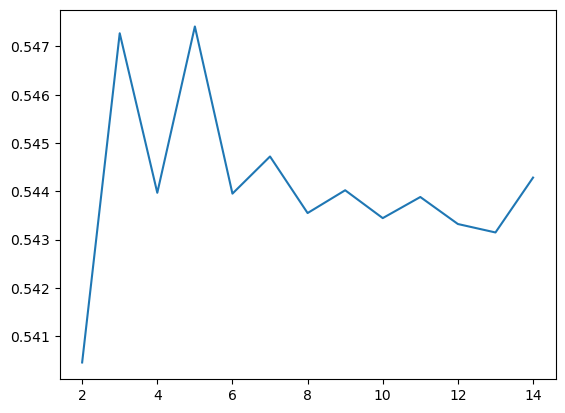

In [ ]:
# Buscando el mejor k con cross validation
rango = range(2, 15)
scores = []

for k in tqdm(rango):
    knn = KNeighborsClassifier(n_neighbors=k)
    scores.append(cross_val(knn, X_val, y_val, 8))

plt.plot(rango, scores)

100%|██████████| 4/4 [05:22<00:00, 80.65s/it] 


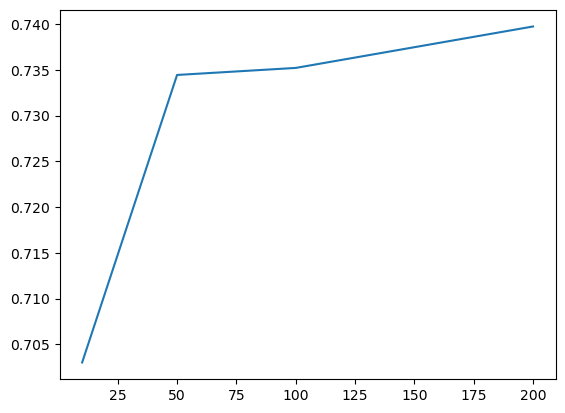

In [ ]:
# Buscando los mejores estimadores random forest
estimators = [10, 50, 100, 200]
scores = []

for e in tqdm(estimators):
    rf = RandomForestClassifier(n_estimators=e, random_state=137)
    scores.append(cross_val(rf, X_val, y_val, 5))

plt.plot(estimators, scores)

In [ ]:
# Cross validation con Regresión Logística
lr = LogisticRegression(random_state=137)
scores = cross_val_score(lr, X_val, y_val, cv=5, scoring='accuracy')
print(np.mean(scores))

0.5453672039278535


In [ ]:
# Cross validation con Multi Layer Perceptron
solvers = ['sgd', 'adam']

for s in tqdm(solvers):
    mlp = MLPClassifier(solver=s, random_state=137, max_iter=1000)
    scores = cross_val_score(mlp, X_val, y_val, cv=5, scoring='accuracy')
    print(f'{s}: {np.mean(scores)}')

 50%|█████     | 1/2 [00:17<00:17, 17.78s/it]

sgd: 0.5441779616314546


100%|██████████| 2/2 [02:17<00:00, 68.73s/it]

adam: 0.5637306747553312
